In [1]:
!lscpu

Architecture:             x86_64
  CPU op-mode(s):         32-bit, 64-bit
  Address sizes:          46 bits physical, 57 bits virtual
  Byte Order:             Little Endian
CPU(s):                   8
  On-line CPU(s) list:    0-7
Vendor ID:                AuthenticAMD
  Model name:             AMD EPYC 9254 24-Core Processor
    CPU family:           25
    Model:                17
    Thread(s) per core:   2
    Core(s) per socket:   4
    Socket(s):            1
    Stepping:             1
    BogoMIPS:             5800.00
    Flags:                fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge m
                          ca cmov pat pse36 clflush mmx fxsr sse sse2 ht syscall
                           nx mmxext fxsr_opt pdpe1gb rdtscp lm constant_tsc rep
                          _good nopl nonstop_tsc cpuid extd_apicid tsc_known_fre
                          q pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2ap
                          ic movbe popcnt tsc_deadline_timer a

In [2]:
!free -h

               total        used        free      shared  buff/cache   available
Mem:           144Gi       2.5Gi       128Gi       0.0Ki        13Gi       140Gi
Swap:             0B          0B          0B


In [3]:
!nvidia-smi

Mon Mar  2 19:51:47 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 565.57.01              Driver Version: 565.57.01      CUDA Version: 12.7     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L40S                    On  |   00000002:00:01.0 Off |                    0 |
| N/A   32C    P8             33W /  350W |       1MiB /  46068MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os

# 1. Define your paths
video_path = "/content/drive/MyDrive/interior_video.mp4"
output_drive_folder = "/content/drive/MyDrive/colmap_images_new"

# 2. Check for existing images
if os.path.exists(output_drive_folder):
    frames = [f for f in os.listdir(output_drive_folder) if f.endswith('.jpg')]
    num_frames = len(frames)
else:
    num_frames = 0

# 3. Logic: Run ffmpeg ONLY if no images are found
if num_frames > 0:
    print(f"✅ Found {num_frames} existing images in: {output_drive_folder}")
    print(f"✓ Skipping ffmpeg. Ready for COLMAP.")
else:
    print(f"🚀 No images found. Starting ffmpeg extraction...")
    os.makedirs(output_drive_folder, exist_ok=True)

    # Run ffmpeg (using your high-quality settings)
    !ffmpeg -i "{video_path}" -vf fps=5 -qscale:v 1 -qmin 1 "{output_drive_folder}/frame_%04d.jpg"

    # Verify after running
    new_frames = len([f for f in os.listdir(output_drive_folder) if f.endswith('.jpg')])
    print(f"\n✓ Done! Extracted {new_frames} frames to: {output_drive_folder}")

✅ Found 731 existing images in: /content/drive/MyDrive/colmap_images_new
✓ Skipping ffmpeg. Ready for COLMAP.


# 3D Gaussian Splatting with 3DGUT Tutorial

This notebook demonstrates the NVIDIA 3DGUT (3D Gaussian with Unscented Transforms) workflow for rendering real-world scenes in interactive simulation.

Based on: https://developer.nvidia.com/blog/how-to-instantly-render-real-world-scenes-in-interactive-simulation/

## Workflow Steps:
1. Environment verification
2. Dataset download (NeRF Synthetic Lego)
3. Training with 3DGUT
4. Visualization
5. Export to USD format for Isaac Sim

## 1. Environment Check and Setup

Verify that we're in the correct conda environment and have all necessary dependencies.

In [4]:
!conda

usage: conda [-h] [-v] [--no-plugins] [-V] COMMAND ...

conda is a tool for managing and deploying applications, environments and packages.

options:
  -h, --help            Show this help message and exit.
  -v, --verbose         Can be used multiple times. Once for detailed output,
                        twice for INFO logging, thrice for DEBUG logging, four
                        times for TRACE logging.
  --no-plugins          Disable all plugins that are not built into conda.
  -V, --version         Show the conda version number and exit.

commands:
  The following built-in and plugins subcommands are available.

  COMMAND
    activate            Activate a conda environment.
    build               Build conda packages from a conda recipe.
    clean               Remove unused packages and caches.
    commands            List all available conda subcommands (including those
                        from plugins). Generally only used by tab-completion.
    compare             Com

In [5]:
!git clone -q --recursive https://github.com/nv-tlabs/3dgrut.git > /dev/null


In [6]:
%pwd
%cd 3dgrut
%pwd

/home/ubuntu/3dgrut


'/home/ubuntu/3dgrut'

In [7]:
!ls

ATTRIBUTIONS.md  benchmark	   render.py	     threedgrut_playground
CONTRIBUTING.md  configs	   requirements.txt  threedgut_tracer
Dockerfile	 install_env.ps1   setup.py	     train.py
LICENSE		 install_env.sh    thirdparty
README.md	 playground.py	   threedgrt_tracer
assets		 rebase_helper.sh  threedgrut


In [8]:
!chmod +x install_env.sh

In [9]:
!./install_env.sh 3dgrut > /dev/null



==> WARNING: A newer version of conda exists. <==
    current version: 25.11.1
    latest version: 26.1.1

Please update conda by running

    $ conda update -n base -c defaults conda


overwriting variable ['TORCH_CUDA_ARCH_LIST']


==> WARNING: A newer version of conda exists. <==
    current version: 25.11.1
    latest version: 26.1.1

Please update conda by running

    $ conda update -n base -c defaults conda




==> WARNING: A newer version of conda exists. <==
    current version: 25.11.1
    latest version: 26.1.1

Please update conda by running

    $ conda update -n base -c defaults conda


  Running command git clone --filter=blob:none --quiet https://github.com/rahul-goel/fused-ssim /tmp/pip-install-hc5pyiod/fused-ssim_b2ec5ce178804e5f81881bb8c5f70643
  Running command git rev-parse -q --verify 'sha^1272e21a282342e89537159e4bad508b19b34157'
  Running command git fetch -q https://github.com/rahul-goel/fused-ssim 1272e21a282342e89537159e4bad508b19b34157
  Running command gi

In [10]:
!conda run -n 3dgrut python -c "import torch; print(torch.__version__); print(torch.version.cuda)"

2.1.2
11.8



In [14]:
%pwd

'/home/ubuntu/3dgrut'

In [15]:
import os
# Set up paths
WORK_DIR = "/home/ubuntu/"
REPO_DIR = os.path.join(WORK_DIR, "3dgrut")
DATA_DIR = os.path.join(WORK_DIR, "data")
OUTPUT_DIR = os.path.join(WORK_DIR, "runs")

# Change to repo directory
os.chdir(REPO_DIR)
print(f"Working directory: {os.getcwd()}")

# Create data and output directories
os.makedirs(DATA_DIR, exist_ok=True)
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"Data directory: {DATA_DIR}")
print(f"Output directory: {OUTPUT_DIR}")

Working directory: /home/ubuntu/3dgrut
Data directory: /home/ubuntu/data
Output directory: /home/ubuntu/runs


In [17]:
!whoami
!command -v sudo && sudo -n true && echo "sudo works" || echo "no passwordless sudo"

ubuntu
/usr/bin/sudo
sudo works


In [18]:
!sudo apt-get update -qq && sudo apt-get install -y -qq colmap > /dev/null

Extracting templates from packages: 100%


In [19]:
# Change this to your actual folder name in Drive
DRIVE_IMAGE_FOLDER = '/home/ubuntu/colmap_images_new'

import os
if os.path.exists(DRIVE_IMAGE_FOLDER):
    print(f"✓ Found {len(os.listdir(DRIVE_IMAGE_FOLDER))} images in {DRIVE_IMAGE_FOLDER}")
else:
    print("⚠️ Folder not found. Please check the path in your Drive.")

✓ Found 731 images in /home/ubuntu/colmap_images_new


In [20]:
!mkdir -p /home/ubuntu/colmap

In [21]:
import os, shutil

COLMAP_WORKDIR = "/home/ubuntu/colmap"   # where database.db + sparse outputs go
IMAGES_DIR = "/home/ubuntu/colmap_images_new"       # where your images are stored

os.makedirs(COLMAP_WORKDIR, exist_ok=True)

db_path = os.path.join(COLMAP_WORKDIR, "database.db")
sparse_path = os.path.join(COLMAP_WORKDIR, "sparse")

for path in [db_path, sparse_path]:
    if os.path.isfile(path):
        os.remove(path)
        print(f"✅ Removed file {path}")
    elif os.path.isdir(path):
        shutil.rmtree(path)
        print(f"✅ Removed dir {path}")
    else:
        print(f"ℹ️ Nothing to remove at {path}")

os.makedirs(sparse_path, exist_ok=True)

ℹ️ Nothing to remove at /home/ubuntu/colmap/database.db
ℹ️ Nothing to remove at /home/ubuntu/colmap/sparse


In [23]:
!nvidia-smi

Mon Mar  2 20:18:17 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 565.57.01              Driver Version: 565.57.01      CUDA Version: 12.7     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L40S                    On  |   00000002:00:01.0 Off |                    0 |
| N/A   31C    P8             71W /  350W |       1MiB /  46068MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [22]:
!colmap exhaustive_matcher --help | grep -i gpu
!colmap feature_extractor --help | grep -i gpu

  --SiftMatching.use_gpu arg (=1)
  --SiftMatching.gpu_index arg (=-1)
  --SiftExtraction.use_gpu arg (=1)
  --SiftExtraction.gpu_index arg (=-1)


In [27]:
!sudo apt-get update -qq && sudo apt-get install -y -qq xvfb

(Reading database ... 147838 files and directories currently installed.)
Preparing to unpack .../xserver-common_2%3a21.1.4-2ubuntu1.7~22.04.16_all.deb ...
Unpacking xserver-common (2:21.1.4-2ubuntu1.7~22.04.16) over (2:21.1.4-2ubuntu1.7~22.04.12) ...
Selecting previously unselected package xvfb.
Preparing to unpack .../xvfb_2%3a21.1.4-2ubuntu1.7~22.04.16_amd64.deb ...
Unpacking xvfb (2:21.1.4-2ubuntu1.7~22.04.16) ...
Setting up xserver-common (2:21.1.4-2ubuntu1.7~22.04.16) ...
Setting up xvfb (2:21.1.4-2ubuntu1.7~22.04.16) ...
Processing triggers for man-db (2.10.2-1) ...
NEEDRESTART-VER: 3.5
NEEDRESTART-KCUR: 5.15.0-126-generic
NEEDRESTART-KEXP: 5.15.0-126-generic
NEEDRESTART-KSTA: 1
NEEDRESTART-SVC: dbus.service
NEEDRESTART-SVC: jupyter.service
NEEDRESTART-SVC: multipathd.service
NEEDRESTART-SVC: networkd-dispatcher.service
NEEDRESTART-SVC: nvidia-dcgm.service
NEEDRESTART-SVC: packagekit.service
NEEDRESTART-SVC: polkit.service


In [28]:
# feature extraction
!xvfb-run -a -s "-screen 0 1920x1080x24" colmap feature_extractor \
  --database_path /home/ubuntu/colmap/database.db \
  --image_path /home/ubuntu/colmap_images_new \
  --ImageReader.single_camera 1 \
  --ImageReader.camera_model PINHOLE \
  --SiftExtraction.use_gpu 1 \
  --SiftExtraction.gpu_index 0


Feature extraction

Processed file [1/731]
  Name:            frame_0001.jpg
  Dimensions:      720 x 1280
  Camera:          #1 - PINHOLE
  Focal Length:    1536.00px
  Features:        3290
Processed file [2/731]
  Name:            frame_0002.jpg
  Dimensions:      720 x 1280
  Camera:          #1 - PINHOLE
  Focal Length:    1536.00px
  Features:        3748
Processed file [3/731]
  Name:            frame_0003.jpg
  Dimensions:      720 x 1280
  Camera:          #1 - PINHOLE
  Focal Length:    1536.00px
  Features:        3837
Processed file [4/731]
  Name:            frame_0004.jpg
  Dimensions:      720 x 1280
  Camera:          #1 - PINHOLE
  Focal Length:    1536.00px
  Features:        4013
Processed file [5/731]
  Name:            frame_0005.jpg
  Dimensions:      720 x 1280
  Camera:          #1 - PINHOLE
  Focal Length:    1536.00px
  Features:        4108
Processed file [6/731]
  Name:            frame_0006.jpg
  Dimensions:      720 x 1280
  Camera:          #1 - PINHOLE


In [30]:
!nvidia-smi

Mon Mar  2 20:39:01 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 565.57.01              Driver Version: 565.57.01      CUDA Version: 12.7     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L40S                    On  |   00000002:00:01.0 Off |                    0 |
| N/A   33C    P8             34W /  350W |       1MiB /  46068MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [31]:
# Matcher (sequenital as the dataset is video images and to make it faster)
!xvfb-run -a -s "-screen 0 1920x1080x24" colmap sequential_matcher \
  --database_path /home/ubuntu/colmap/database.db \
  --SiftMatching.use_gpu 1 \
  --SiftMatching.gpu_index 0


Sequential feature matching

Matching image [1/731] in 2.721s
Matching image [2/731] in 2.951s
Matching image [3/731] in 2.902s
Matching image [4/731] in 2.916s
Matching image [5/731] in 3.000s
Matching image [6/731] in 2.946s
Matching image [7/731] in 2.947s
Matching image [8/731] in 3.133s
Matching image [9/731] in 3.192s
Matching image [10/731] in 2.842s
Matching image [11/731] in 2.809s
Matching image [12/731] in 3.020s
Matching image [13/731] in 3.178s
Matching image [14/731] in 2.744s
Matching image [15/731] in 3.077s
Matching image [16/731] in 2.956s
Matching image [17/731] in 3.506s
Matching image [18/731] in 3.588s
Matching image [19/731] in 3.845s
Matching image [20/731] in 4.110s
Matching image [21/731] in 3.639s
Matching image [22/731] in 4.194s
Matching image [23/731] in 4.549s
Matching image [24/731] in 4.830s
Matching image [25/731] in 5.070s
Matching image [26/731] in 4.818s
Matching image [27/731] in 5.179s
Matching image [28/731] in 5.535s
Matching image [29/731] in 

In [32]:
# Mapper
!colmap mapper \
  --database_path /home/ubuntu/colmap/database.db \
  --image_path /home/ubuntu/colmap_images_new \
  --output_path /home/ubuntu/colmap/sparse


Loading database

Loading cameras... 1 in 0.000s
Loading matches... 9919 in 0.093s
Loading images... 731 in 0.088s (connected 731)
Building correspondence graph... in 0.811s (ignored 0)

Elapsed time: 0.017 [minutes]


Finding good initial image pair


Initializing with image pair #698 and #693


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.406784e+04    0.00e+00    1.43e+06   0.00e+00   0.00e+00  1.00e+04        0    3.42e-03    1.06e-02
   1  3.255338e+04   -8.49e+03    1.43e+06   1.88e+02  -1.26e+00  5.00e+03        1    3.61e-03    1.42e-02
   2  2.053978e+04    3.53e+03    7.73e+05   1.32e+02   5.55e-01  5.01e+03        1    4.83e-03    1.91e-02
   3  1.757798e+04    2.96e+03    9.92e+05   6.44e+01   8.49e-01  7.58e+03        1    5.12e-03    2.42e-02
   4  2.169173e+04   -4.11e+03    9.92e+05   1.30e+02  -1.56e+00  3.79e+03        1    2.25e-03    2.65e-02
   5  1.617751e+04    1.40e

In [34]:
!mkdir -p /home/ubuntu/colmap/sparse_txt
!ls -lah /home/ubuntu/colmap/sparse
!ls -lah /home/ubuntu/colmap/sparse/0 || true

total 12K
drwxrwxr-x 3 ubuntu ubuntu 4.0K Mar  2 22:21 .
drwxrwxr-x 4 ubuntu ubuntu 4.0K Mar  2 22:22 ..
drwxrwxr-x 2 ubuntu ubuntu 4.0K Mar  2 22:21 0
total 87M
drwxrwxr-x 2 ubuntu ubuntu 4.0K Mar  2 22:21 .
drwxrwxr-x 3 ubuntu ubuntu 4.0K Mar  2 22:21 ..
-rw-rw-r-- 1 ubuntu ubuntu   64 Mar  2 22:21 cameras.bin
-rw-rw-r-- 1 ubuntu ubuntu  65M Mar  2 22:21 images.bin
-rw-rw-r-- 1 ubuntu ubuntu  23M Mar  2 22:21 points3D.bin
-rw-rw-r-- 1 ubuntu ubuntu 1.7K Mar  2 22:21 project.ini


In [35]:
!colmap model_converter \
  --input_path /home/ubuntu/colmap/sparse/0 \
  --output_path /home/ubuntu/colmap/sparse_txt \
  --output_type TXT

In [36]:
import os

colmap_path = "/home/ubuntu/colmap/sparse/0"
required_files = ["cameras.bin", "images.bin", "points3D.bin"]

print("Checking COLMAP output structure...")
if os.path.exists(colmap_path):
    found_files = os.listdir(colmap_path)
    all_present = True
    for f in required_files:
        if f in found_files:
            print(f"✓ {f} found.")
        else:
            print(f"✗ {f} is MISSING!")
            all_present = False

    if all_present:
        print("\n✅ Structure is correct! You are ready to run the training command.")
    else:
        print("\n⚠️ COLMAP mapper may have failed or is still running.")
else:
    print(f"\n❌ Directory {colmap_path} not found. Check if 'colmap mapper' finished successfully.")

Checking COLMAP output structure...
✓ cameras.bin found.
✓ images.bin found.
✓ points3D.bin found.

✅ Structure is correct! You are ready to run the training command.


## 4. Train with 3DGUT

Run the training process. This will:
1. Initialize 3D Gaussians from the dataset
2. Optimize Gaussian parameters using the 3DGUT method
3. Save checkpoints at iterations 7000 and 30000
4. Export to USD format (if enabled)

In [37]:
!conda run -n 3dgrut pip install viser -q

In [38]:
import os
import shutil

src_dir = "/home/ubuntu/colmap_images_new"
dst_dir = "/home/ubuntu/colmap/images"

os.makedirs(dst_dir, exist_ok=True)

copied = 0
for name in os.listdir(src_dir):
    src = os.path.join(src_dir, name)
    dst = os.path.join(dst_dir, name)
    if os.path.isfile(src):
        shutil.copy2(src, dst)
        copied += 1

print(f"Copied {copied} files to {dst_dir}")

Copied 731 files to /home/ubuntu/colmap/images


In [39]:
!ls /home/ubuntu/colmap/images | head
!ls /home/ubuntu/colmap/images | wc -l

frame_0001.jpg
frame_0002.jpg
frame_0003.jpg
frame_0004.jpg
frame_0005.jpg
frame_0006.jpg
frame_0007.jpg
frame_0008.jpg
frame_0009.jpg
frame_0010.jpg
731


In [40]:
# train 3dgrut
!mkdir -p /home/ubuntu/runs
!conda run -n 3dgrut python train.py --config-name apps/colmap_3dgut_mcmc.yaml \
  path=/home/ubuntu/colmap/ \
  out_dir=/home/ubuntu/runs/ \
  experiment_name=my_interior_scene \
  export_usdz.enabled=true \
  export_usdz.apply_normalizing_transform=true

[22:30:03] [INFO] Git hash:                                         ]8;id=876802;file:///home/ubuntu/3dgrut/threedgrut/utils/logger.py\logger.py]8;;\:]8;id=399453;file:///home/ubuntu/3dgrut/threedgrut/utils/logger.py#67\67]8;;\
           a03c594e66e0900f3fb784d6c2c6b0e2518c70c7                             
           [INFO] Compiling native code..                           ]8;id=130275;file:///home/ubuntu/3dgrut/threedgrut/utils/logger.py\logger.py]8;;\:]8;id=315512;file:///home/ubuntu/3dgrut/threedgrut/utils/logger.py#67\67]8;;\
──────────────────────────────── Load Datasets ─────────────────────────────────
[22:30:07] [INFO] 📷 EXIF: No exposure data found in 731 images     ]8;id=369718;file:///home/ubuntu/3dgrut/threedgrut/utils/logger.py\logger.py]8;;\:]8;id=720371;file:///home/ubuntu/3dgrut/threedgrut/utils/logger.py#67\67]8;;\

Load Dataset (train) ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━   0% :: 🕒 Elapsed 0:00:00
Load Dataset (train) ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## 5. Check Training Results

Verify that training completed and checkpoints were saved.

Showing results from latest run: /home/ubuntu/runs/my_interior_scene/colmap-0203_223304

Displaying: 00000.png


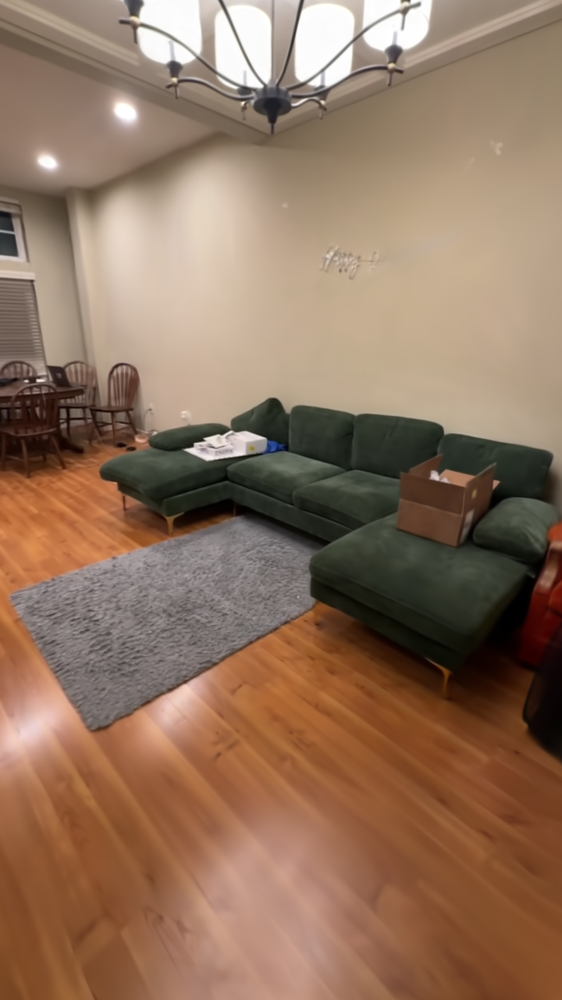

Displaying: 00001.png


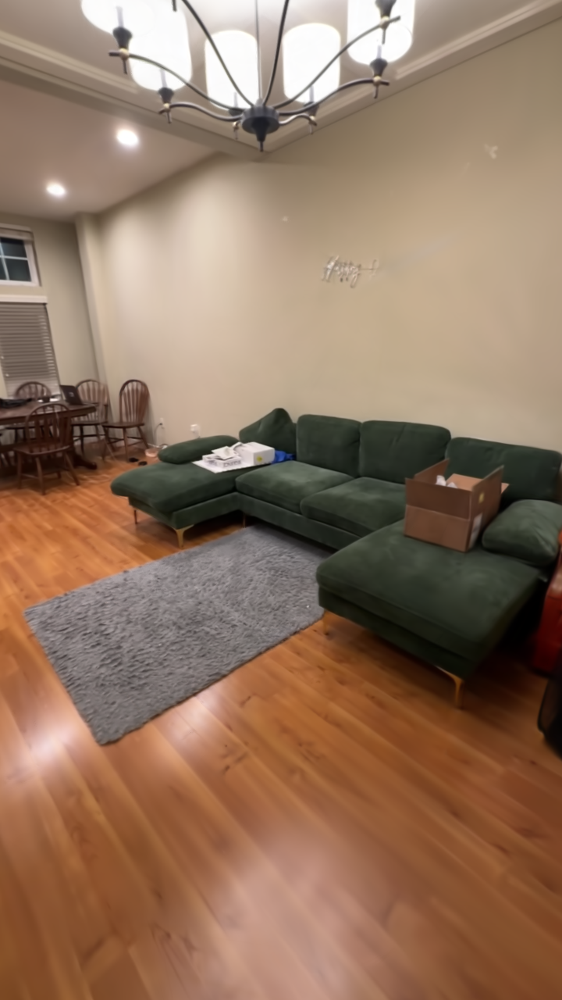

Displaying: 00002.png


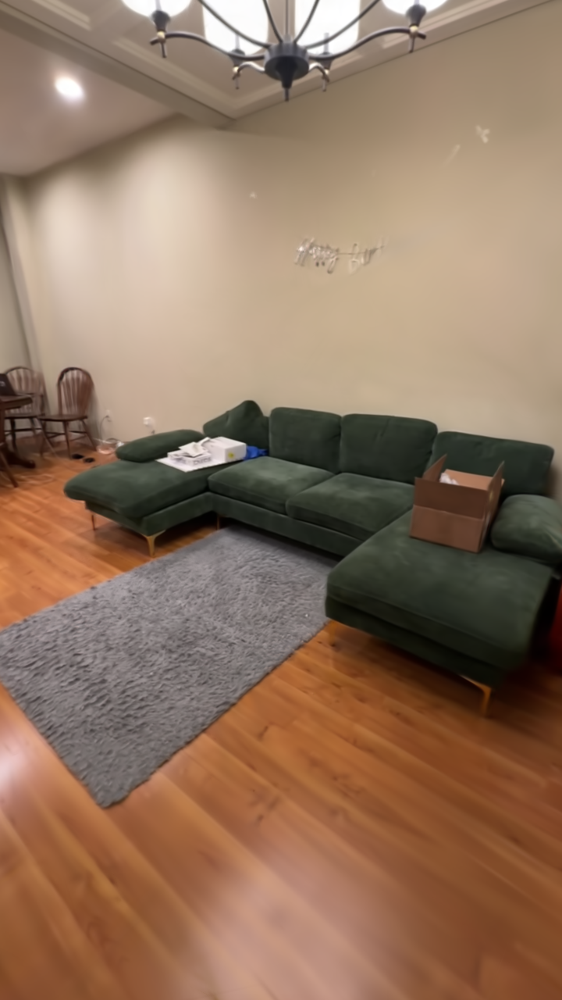

Displaying: 00003.png


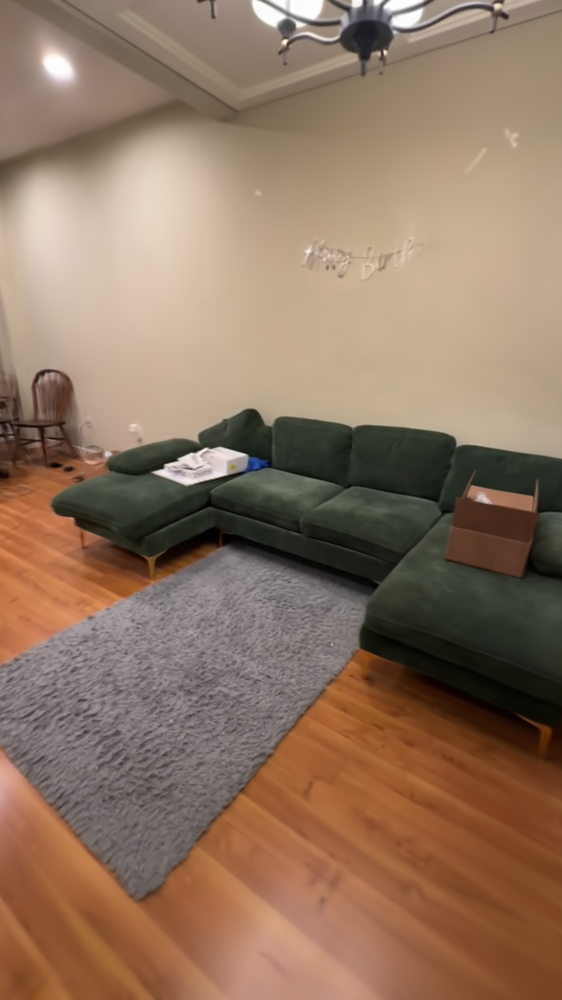

Displaying: 00004.png


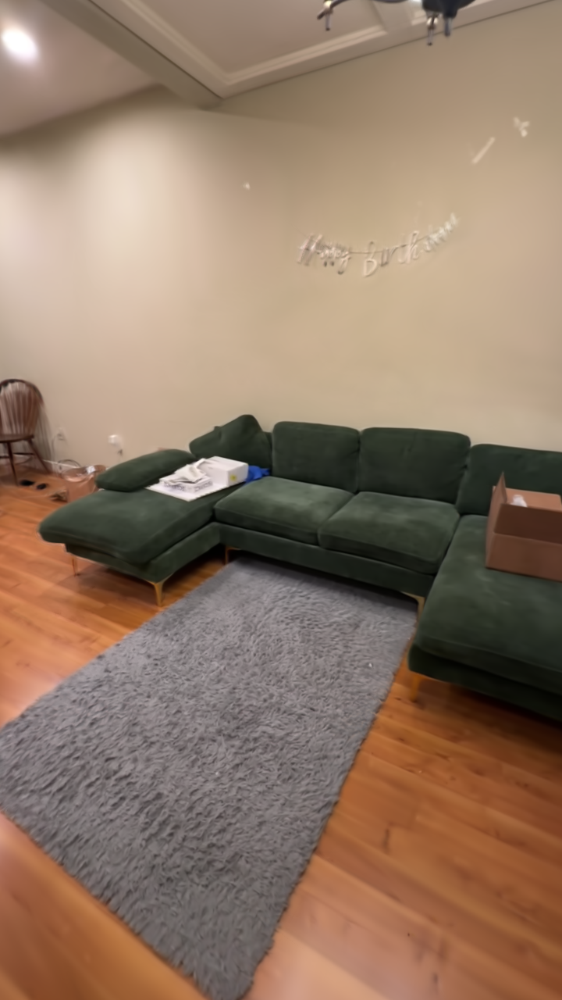

In [41]:
import glob
import os
from IPython.display import Image, display

# 1. Path to your experiment
base_dir = "/home/ubuntu/runs/my_interior_scene/"

# 2. Automatically find the LATEST timestamped folder
# (This ensures you see the most recent run, not an old one)
subdirs = [os.path.join(base_dir, d) for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
actual_dir = max(subdirs, key=os.path.getmtime)

print(f"Showing results from latest run: {actual_dir}\n")

# 3. Path to the renders at 30,000 iterations
render_dir = os.path.join(actual_dir, "ours_30000/renders")

if os.path.exists(render_dir):
    # Get the first 5 rendered images
    images = sorted(glob.glob(os.path.join(render_dir, "*.png")))[:5]

    if not images:
        print(f"⚠️ No images found in {render_dir}. Check if training finished.")
    else:
        for img in images:
            print(f"Displaying: {os.path.basename(img)}")
            display(Image(filename=img, width=500))
else:
    print(f"❌ Render directory not found: {render_dir}")
    print("If your training is still running, this folder will appear once it hits 30k iterations.")

In [42]:
!sudo apt-get update -qq && sudo apt-get install -y -qq ffmpeg

Extracting templates from packages: 100%
Selecting previously unselected package libaom3:amd64.
(Reading database ... 147845 files and directories currently installed.)
Preparing to unpack .../00-libaom3_3.3.0-1ubuntu0.1_amd64.deb ...
Unpacking libaom3:amd64 (3.3.0-1ubuntu0.1) ...
Selecting previously unselected package libva2:amd64.
Preparing to unpack .../01-libva2_2.14.0-1_amd64.deb ...
Unpacking libva2:amd64 (2.14.0-1) ...
Selecting previously unselected package libmfx1:amd64.
Preparing to unpack .../02-libmfx1_22.3.0-1_amd64.deb ...
Unpacking libmfx1:amd64 (22.3.0-1) ...
Selecting previously unselected package libva-drm2:amd64.
Preparing to unpack .../03-libva-drm2_2.14.0-1_amd64.deb ...
Unpacking libva-drm2:amd64 (2.14.0-1) ...
Selecting previously unselected package libva-x11-2:amd64.
Preparing to unpack .../04-libva-x11-2_2.14.0-1_amd64.deb ...
Unpacking libva-x11-2:amd64 (2.14.0-1) ...
Selecting previously unselected package libavutil56:amd64.
Preparing to unpack .../05-libavu

In [51]:
import os

base_dir = "/home/ubuntu/runs/my_interior_scene/"
subdirs = [
    os.path.join(base_dir, d)
    for d in os.listdir(base_dir)
    if os.path.isdir(os.path.join(base_dir, d))
]
actual_dir = max(subdirs, key=os.path.getmtime)
render_dir = os.path.join(actual_dir, "ours_30000", "renders")

print("actual_dir =", actual_dir)
print("render_dir  =", render_dir)

actual_dir = /home/ubuntu/runs/my_interior_scene/colmap-0203_223304
render_dir  = /home/ubuntu/runs/my_interior_scene/colmap-0203_223304/ours_30000/renders


In [52]:
import glob, os

render_pngs = sorted(glob.glob(os.path.join(render_dir, "*.png")))
orig_jpgs = sorted(glob.glob("/home/ubuntu/colmap/images/*.jpg"))

print("num rendered pngs:", len(render_pngs))
print("num original jpgs:", len(orig_jpgs))

print("sample rendered file:", render_pngs[0] if render_pngs else None)
print("sample original file:", orig_jpgs[0] if orig_jpgs else None)

num rendered pngs: 92
num original jpgs: 731
sample rendered file: /home/ubuntu/runs/my_interior_scene/colmap-0203_223304/ours_30000/renders/00000.png
sample original file: /home/ubuntu/colmap/images/frame_0001.jpg


In [54]:
!ls -1 /home/ubuntu/runs/my_interior_scene/colmap-0203_223304 | grep '^ours_'

ours_30000
ours_7000


In [56]:
!find /home/ubuntu/runs/my_interior_scene/colmap-0203_223304/ours_30000 -maxdepth 2 -type d -print

/home/ubuntu/runs/my_interior_scene/colmap-0203_223304/ours_30000
/home/ubuntu/runs/my_interior_scene/colmap-0203_223304/ours_30000/renders


In [57]:
!find /home/ubuntu/3dgrut -maxdepth 4 -type f \( -iname "*render*" -o -iname "*eval*" -o -iname "*video*" -o -iname "*viewer*" \) | head -n 50

/home/ubuntu/3dgrut/threedgrut_playground/utils/video_out.py
/home/ubuntu/3dgrut/threedgut_tracer/src/gutRenderer.cu
/home/ubuntu/3dgrut/threedgrut/render.py
/home/ubuntu/3dgrut/threedgrut/__pycache__/render.cpython-311.pyc
/home/ubuntu/3dgrut/threedgrut/utils/render.py
/home/ubuntu/3dgrut/threedgrut/utils/__pycache__/render.cpython-311.pyc
/home/ubuntu/3dgrut/benchmark/zipnerf_render.sh
/home/ubuntu/3dgrut/benchmark/nerf_synthetic_render.sh
/home/ubuntu/3dgrut/benchmark/mipnerf360_render.sh
/home/ubuntu/3dgrut/benchmark/scannetpp_render.sh
/home/ubuntu/3dgrut/render.py
/home/ubuntu/3dgrut/assets/render_lego.jpg


In [58]:
!grep -RIn --line-number -E "ours_[0-9]+|ours_30000|/renders|renders\"" /home/ubuntu/3dgrut | head -n 50

/home/ubuntu/3dgrut/threedgrut/render.py:202:        output_path_renders = os.path.join(self.out_dir, f"ours_{int(self.global_step)}", "renders")


In [59]:
!find /home/ubuntu/runs/my_interior_scene/colmap-0203_223304 -maxdepth 4 -type f -name "ckpt*.pt" | sort

/home/ubuntu/runs/my_interior_scene/colmap-0203_223304/ckpt_last.pt
/home/ubuntu/runs/my_interior_scene/colmap-0203_223304/ours_30000/ckpt_30000.pt
/home/ubuntu/runs/my_interior_scene/colmap-0203_223304/ours_7000/ckpt_7000.pt


In [61]:
!conda run -n 3dgrut python /home/ubuntu/3dgrut/render.py \
  --checkpoint /home/ubuntu/runs/my_interior_scene/colmap-0203_223304/ckpt_last.pt \
  --out-dir /home/ubuntu/runs/my_interior_scene/colmap-0203_223304/render_showcase

ninja: no work to do.
[23:27:27] [INFO] 📷 EXIF: No exposure data found in 731 images     ]8;id=282275;file:///home/ubuntu/3dgrut/threedgrut/utils/logger.py\logger.py]8;;\:]8;id=452567;file:///home/ubuntu/3dgrut/threedgrut/utils/logger.py#67\67]8;;\

Load Dataset (val) ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━   0% :: 🕒 Elapsed 0:00:00
Load Dataset (val) ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% :: 🕒 Elapsed 0:00:00
Load Dataset (val) ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% :: 🕒 Elapsed 0:00:00
Rendering ━━━━━━━━━━━━━━━━━━━━━━━━   0%  :: 🚗💨 Speed: ? :: 🕒 Elapsed: 0:00:00
Rendering ━━━━━━━━━━━━━━━━━━━━━━━━   0%  :: 🚗💨 Speed: ? :: 🕒 Elapsed: 0:00:00
Rendering ━━━━━━━━━━━━━━━━━━━━━━━━   0%  :: 🚗💨 Speed: ? :: 🕒 Elapsed: 0:00:00
Rendering ━━━━━━━━━━━━━━━━━━━━━━━━   0%  :: 🚗💨 Speed: ? :: 🕒 Elapsed: 0:00:00
Rendering ━━━━━━━━━━━━━━━━━━━━━━━━   0%  :: 🚗💨 Speed: ? :: 🕒 Elapsed: 0:00:00
Rendering ━━━━━━━━━━━━━━━━━━━━━━━━   0%  :: 🚗💨 Speed: ? :: 🕒 Elapsed: 0:00:00
Rendering ━━━━━━━━━━━━━━━━━━━━━━━━

In [62]:
!find /home/ubuntu/runs/my_interior_scene/colmap-0203_223304/render_showcase -type d -name renders | head -n 20

/home/ubuntu/runs/my_interior_scene/colmap-0203_223304/render_showcase/my_interior_scene/colmap-0203_232725/ours_30000/renders


In [63]:
!find /home/ubuntu/runs/my_interior_scene/colmap-0203_223304/render_showcase -type f -name "*.png" | wc -l

184


In [65]:
import subprocess
import glob
import os
import base64
from IPython.display import HTML, display

# render_dir should already be set from your previous cell, e.g.
# render_dir = "/home/ubuntu/runs/my_interior_scene/<latest>/ours_30000/renders"

output_video_path = "/home/ubuntu/runs/my_interior_scene/my_interior_reconstruction.mp4"

def create_video_from_renders(render_folder, output_path, fps=24):
    image_files = sorted(glob.glob(os.path.join(render_folder, "*.png")))
    if not image_files:
        print(f"No images found in {render_folder}")
        return None

    os.makedirs(os.path.dirname(output_path), exist_ok=True)

    list_file = "/tmp/interior_image_list.txt"
    with open(list_file, "w") as f:
        for img in image_files:
            f.write(f"file '{img}'\n")
            f.write(f"duration {1.0/float(fps)}\n")
        f.write(f"file '{image_files[-1]}'\n")

    cmd = [
        "ffmpeg", "-y",
        "-f", "concat", "-safe", "0",
        "-i", list_file,
        "-vsync", "vfr",
        "-pix_fmt", "yuv420p",
        "-vf", "pad=ceil(iw/2)*2:ceil(ih/2)*2",
        output_path,
    ]

    result = subprocess.run(cmd, capture_output=True, text=True)
    if result.returncode == 0:
        print(f"Video created: {output_path}")
        return output_path
    else:
        print(f"ffmpeg error:\n{result.stderr}")
        return None

def display_video(video_path):
    with open(video_path, "rb") as f:
        video_data = f.read()
    video_base64 = base64.b64encode(video_data).decode("ascii")
    return HTML(f"""
    <video width="800" controls autoplay loop>
        <source src="data:video/mp4;base64,{video_base64}" type="video/mp4">
    </video>
    """)

showcase_render_dir = "/home/ubuntu/runs/my_interior_scene/colmap-0203_223304/render_showcase/my_interior_scene/colmap-0203_232725/ours_30000/renders"
output_video_path = "/home/ubuntu/runs/my_interior_scene/colmap-0203_223304/render_showcase/showcase_ours_30000.mp4"

video_path = create_video_from_renders(showcase_render_dir, output_video_path, fps=10)
if video_path:
    display(display_video(video_path))

Video created: /home/ubuntu/runs/my_interior_scene/colmap-0203_223304/render_showcase/showcase_ours_30000.mp4


In [66]:
render_dir = "/home/ubuntu/runs/my_interior_scene/colmap-0203_223304/render_showcase/my_interior_scene/colmap-0203_232725/ours_30000/renders"

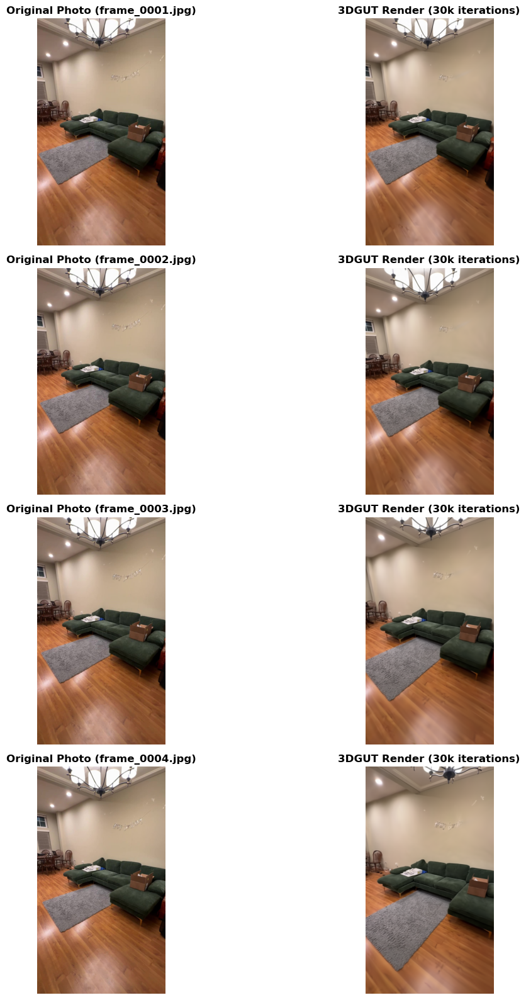

Showing 4 comparisons between original photos and 3D renders


In [67]:
# Before/After Training Comparison for Interior Images
import matplotlib.pyplot as plt
from PIL import Image as PILImage
import glob
import os

dataset_path = "/home/ubuntu/colmap/images"

test_images = sorted(glob.glob(os.path.join(dataset_path, "*.jpg")))
rendered_images = sorted(glob.glob(os.path.join(render_dir, "*.png")))

if test_images and rendered_images:
    num_comparisons = min(4, len(test_images), len(rendered_images))

    fig, axes = plt.subplots(num_comparisons, 2, figsize=(14, 4 * num_comparisons))
    if num_comparisons == 1:
        axes = axes.reshape(1, -1)

    for i in range(num_comparisons):
        gt_img = PILImage.open(test_images[i])
        axes[i, 0].imshow(gt_img)
        axes[i, 0].set_title(f"Original Photo ({os.path.basename(test_images[i])})", fontsize=12, fontweight="bold")
        axes[i, 0].axis("off")

        rendered_img = PILImage.open(rendered_images[i])
        axes[i, 1].imshow(rendered_img)
        axes[i, 1].set_title("3DGUT Render (30k iterations)", fontsize=12, fontweight="bold")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()

    print(f"Showing {num_comparisons} comparisons between original photos and 3D renders")
else:
    print("Could not find images.")
    print(f"Checked for photos in: {dataset_path}")
    print(f"Checked for renders in: {render_dir}")

In [68]:
# Check USD export for Isaac Sim
usd_files = glob.glob(os.path.join(actual_dir, '*.usdz')) + glob.glob(os.path.join(actual_dir, '*.usd'))

if usd_files:
    print("✓ USD files exported for Isaac Sim:\n")
    for usd_file in usd_files:
        file_size = os.path.getsize(usd_file) / (1024 * 1024)  # MB
        print(f"  📦 {os.path.basename(usd_file)}")
        print(f"     Size: {file_size:.2f} MB")
        print(f"     Path: {usd_file}\n")

    print("=" * 60)
    print("How to use in Isaac Sim:")
    print("=" * 60)
    print("1. Open NVIDIA Isaac Sim")
    print("2. File → Open or drag-and-drop the .usdz file")
    print("3. The 3D Gaussian Splatting scene will load")
    print("4. Add physics, robots, or other simulation elements")
    print("\nAlternatively, load programmatically:")
    print(f"```python")
    print(f"from pxr import Usd")
    print(f"stage = Usd.Stage.Open('{usd_files[0]}')")
    print(f"```")
else:
    print("⚠️  No USD files found")
    print("\nTo export USD, re-run training with:")
    print("export_usdz.enabled=true")

✓ USD files exported for Isaac Sim:

  📦 export_last.usdz
     Size: 112.55 MB
     Path: /home/ubuntu/runs/my_interior_scene/colmap-0203_223304/export_last.usdz

How to use in Isaac Sim:
1. Open NVIDIA Isaac Sim
2. File → Open or drag-and-drop the .usdz file
3. The 3D Gaussian Splatting scene will load
4. Add physics, robots, or other simulation elements

Alternatively, load programmatically:
```python
from pxr import Usd
stage = Usd.Stage.Open('/home/ubuntu/runs/my_interior_scene/colmap-0203_223304/export_last.usdz')
```


In [ ]:
from google.colab import files
import os

# Use the exact path from your output
file_path = "/home/ubuntu/runs/my_interior_scene/colmap-0203_223304/export_last.usdz"

if os.path.exists(file_path):
    files.download(file_path)
else:
    print("File not found. Please check the path.")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [71]:
!conda run -n 3dgrut python -m pip install viser open3d

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/447.7 MB ? eta -:--:--
   ━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.9/447.7 MB 97.6 MB/s eta 0:00:05
   ━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/447.7 MB 124.5 MB/s eta 0:00:04
   ━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.1/447.7 MB 130.8 MB/s eta 0:00:03
   ━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.2/447.7 MB 142.2 MB/s eta 0:00:03
   ━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.8/447.7 MB 146.9 MB/s eta 0:00:03
   ━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━ 174.1/447.7 MB 145.0 MB/s eta 0:00:02
   ━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━━━━ 204.5/447.7 MB 146.2 MB/s eta 0:00:02
   ━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━━ 237.0/447.7 MB 148.0 MB/s eta 0:00:02
   ━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━ 267.9/447.7 MB 150.9 MB/s eta 0:00:02
   ━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━ 298.8/447.7 MB 155.8 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━ 336.6/447.7 MB 161.1 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━

In [69]:
!colmap model_converter \
  --input_path /home/ubuntu/colmap/sparse/0 \
  --output_path /home/ubuntu/colmap/sparse.ply \
  --output_type PLY

In [75]:
import sys, site
print("python:", sys.executable)
print("prefix:", sys.prefix)
print("site-packages:", site.getsitepackages())

python: /home/ubuntu/anaconda3/bin/python
prefix: /home/ubuntu/anaconda3
site-packages: ['/home/ubuntu/anaconda3/lib/python3.13/site-packages']


In [80]:
!pip install viser plyfile numpy

  Using cached viser-1.0.24-py3-none-any.whl.metadata (5.3 kB)
  Using cached plyfile-1.1.3-py3-none-any.whl.metadata (43 kB)
  Using cached trimesh-4.11.2-py3-none-any.whl.metadata (13 kB)
  Using cached yourdfpy-0.0.60-py3-none-any.whl.metadata (9.0 kB)
  Using cached colorlog-6.10.1-py3-none-any.whl.metadata (11 kB)
  Using cached svg_path-7.0-py2.py3-none-any.whl.metadata (14 kB)
  Using cached pycollada-0.9.3-py3-none-any.whl.metadata (1.7 kB)
Using cached viser-1.0.24-py3-none-any.whl (4.9 MB)
Using cached trimesh-4.11.2-py3-none-any.whl (740 kB)
Using cached yourdfpy-0.0.60-py3-none-any.whl (22 kB)
Using cached plyfile-1.1.3-py3-none-any.whl (36 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 63.5 MB/s  0:00:00
Using cached colorlog-6.10.1-py3-none-any.whl (11 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.2/17.2 MB 91.8 MB/s  0:00:00
Using cached pycollada-0.9.3-py3-none-any.whl (129 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 128.6 MB/s  0:00:00
U

In [ ]:
import numpy as np
import viser
from plyfile import PlyData

ply_path = "/home/ubuntu/colmap/sparse.ply"
ply = PlyData.read(ply_path)
v = ply["vertex"]

points = np.stack([v["x"], v["y"], v["z"]], axis=1).astype(np.float32)

colors = None
if {"red", "green", "blue"}.issubset(v.data.dtype.names):
    colors = np.stack([v["red"], v["green"], v["blue"]], axis=1).astype(np.uint8)

server = viser.ViserServer(host="0.0.0.0", port=8890)
server.scene.add_point_cloud(
    name="colmap_sparse",
    points=points,
    colors=colors,
    point_size=0.01,
)

print("Viewer running. Open port 8890 in your Brev/VSCode port-forwarding UI.")

╭────── viser (listening *:8891) ───────╮
│             ╷                         │
│   HTTP      │ http://localhost:8891   │
│   Websocket │ ws://localhost:8891     │
│             ╵                         │
╰───────────────────────────────────────╯

Viewer running. Open port 8890 in your Brev/VSCode port-forwarding UI.


(viser) Connection opened (0, 1 total), 7 persistent messages

In [82]:
!ss -ltnp | grep 8890 || true

LISTEN 0      100          0.0.0.0:8890       0.0.0.0:*    users:(("python",pid=26973,fd=81))         


In [83]:
!ss -ltnp | grep 8890 || true

LISTEN 0      100          0.0.0.0:8890       0.0.0.0:*    users:(("python",pid=26973,fd=81))         


In [85]:
from IPython.display import IFrame, display

display(IFrame(src="http://127.0.0.1:8891", width="100%", height=600))

(viser) Connection opened (1, 2 total), 7 persistent messages

(viser) Connection closed (1, 1 total)